In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Importing Libraries

In [3]:
import warnings
warnings.filterwarnings("ignore")

import os
import numpy as np
import pandas as pd
import gzip
import os
from tqdm.notebook import tqdm
from matplotlib import pyplot as plt
import re
import datetime

import tensorflow as tf

from tensorflow.keras.callbacks import ModelCheckpoint
%load_ext tensorboard

tf.compat.v1.enable_eager_execution()

from tensorflow.keras.layers import Input, Softmax, RNN, Dense, Embedding, LSTM,concatenate,Flatten
from tensorflow.keras.models import Model

Fixing Random Seed

In [4]:
import random as rn

##fixing numpy RS
np.random.seed(1)

##fixing tensorflow RS
tf.random.set_seed(2)

##python RS
rn.seed(3)

## Reading Data

In [5]:
#Reference --> http://jmcauley.ucsd.edu/data/amazon/qa/

def parse(path):
  '''Reading file having .gz extension'''

  g = gzip.open(path, 'rb')
  for l in g:
    yield eval(l)

def getDF(path):
  ''' Reading .gz File and converting into pandas dataframe'''
  
  i = 0
  df = {}
  for d in parse(path):
    df[i] = d
    i += 1
  return pd.DataFrame.from_dict(df, orient='index')

In [ ]:
#Function for calculating memory usage of dataframe
def memory_usage(df):
    memory=round(df.memory_usage(index=True).sum(),3)
    return memory/ 1024**2

### Reading & Merging Q/A Data and Products Metadata

In [8]:
#Defining path for both q/a data and metadata
source = "/content/drive/My Drive/qa data/"
source_meta = "/content/drive/My Drive/metadata/"

df = pd.DataFrame()

#Iterating over each file for q/a and metadata
for file in tqdm(os.listdir(source)):

    #Fetching q/a dataframe 
    temp_df=getDF(source+file)

    #Deleting unnecessary columns
    del temp_df['unixTime'] ,temp_df['answerTime'] 

    #Using the filename for getting category of the products and adding it as a column. 
    category_name = file[3:-8]
    category = [category_name]*len(temp_df)
    temp_df['category'] = category
    del category

    #Fetching metadata dataframe 
    meta_file = 'meta_'+category_name+'.json.gz'
    temp_meta = getDF(source_meta+meta_file)

    #Filtering columns
    temp_meta = temp_meta.filter(items=['asin', 'description','title','brand','price','main_cat','feature'])
    #Dropping duplicates
    temp_meta.drop_duplicates(subset='asin',inplace=True)

    #merging q/a data and metadata together
    temp_df = temp_df.merge(temp_meta, on='asin',how='left')
    del temp_meta

    #Appending each category of data to final dataframe
    df = df.append(temp_df)
    del temp_df
     
print("Memory used by Dataframe --> %.3f"%memory_usage(df),"MB")
df


Memory used by Dataframe --> 53.545 MB


,questionType,asin,question,answerType,answer,category,description,title,brand,price,main_cat,feature
0,yes/no,B00004U9JP,I have a 9 year old Badger 1 that needs replac...,?,I replaced my old one with this without a hitch.,Appliances,NaN,NaN,NaN,NaN,NaN,NaN
1,open-ended,B00004U9JP,model number,NaN,This may help InSinkErator Model BADGER-1: Bad...,Appliances,NaN,NaN,NaN,NaN,NaN,NaN
2,yes/no,B00004U9JP,can I replace Badger 1 1/3 with a Badger 5 1/2...,?,Plumbing connections will vary with different ...,Appliances,NaN,NaN,NaN,NaN,NaN,NaN
3,yes/no,B00004U9JP,Does this come with power cord and dishwasher ...,?,It does not come with a power cord. It does co...,Appliances,NaN,NaN,NaN,NaN,NaN,NaN
4,open-ended,B00004U9JP,loud noise inside when turned on. sounds like ...,NaN,Check if you dropped something inside.Usually ...,Appliances,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
314258,yes/no,BT008UKTMW,Is the space from bottom of desktop to tray ad...,N,No,Electronics,NaN,NaN,NaN,NaN,NaN,NaN
314259,yes/no,BT008UKTMW,can the mouse extension be mounted on the LEFT...,Y,"yes, you can put it on which ever side you want",Electronics,NaN,NaN,NaN,NaN,NaN,NaN
314260,yes/no,BT008UKTMW,does it come with all the hardware,Y,"It's been a while since I bought this, but I'm...",Electronics,NaN,NaN,NaN,NaN,NaN,NaN
314261,open-ended,BT008UKTMW,how wide is it? I need a 19 inch length tray f...,NaN,We just measured the tray and it is 21 inches ...,Electronics,NaN,NaN,NaN,NaN,NaN,NaN


##Checking Missing values

In [9]:
def find_nan_values(df):
    ''' finds and prints % of missing values in each column of dataframe.'''
    if df.isnull().values.any():
        null_columns=df.columns[df.isnull().any()].tolist()
        for column in null_columns:
            total_values=df.shape[0]
            null_values=df[column].isnull().sum()
            print("No. of Nan Values in '{}' column --> {}".format(column,null_values))
            print("{:.2f} % of Total values".format((100 * null_values) / total_values))
            print("\n")
    else:
        print("No Column has Nan Values")


In [10]:
find_nan_values(df)

No. of Nan Values in 'answerType' column --> 252193
46.71 % of Total values


No. of Nan Values in 'description' column --> 242641
44.95 % of Total values


No. of Nan Values in 'title' column --> 220392
40.82 % of Total values


No. of Nan Values in 'brand' column --> 221807
41.09 % of Total values


No. of Nan Values in 'price' column --> 380674
70.51 % of Total values


No. of Nan Values in 'main_cat' column --> 220817
40.90 % of Total values


No. of Nan Values in 'feature' column --> 254075
47.06 % of Total values




* Columns containing product metadata have missing values around 40% - 50% (i.e around half of the products do not have metadata) except price which has 70% of missing data.
* Answer type is also unknown for approx. 47% data.

## Cleaning Data

### Converting Columns having List to String

In [11]:
def list_to_string(df,columns):
    ''' Converts columns having list datatype to string'''

    #Iterating over columns
    for column in columns:
        temp = []

        #Iterating over values in column
        for text in tqdm(df[column]):
            try :
                if pd.isnull(text):
                    temp.append(text)
                else:
                    temp.append(' '.join(text))
            except:
                temp.append(' '.join(text))
  
        df[column] = temp

    return df

#These two columns have list dataype       
columns=['description','feature']

df = list_to_string(df,columns)
df.head()

,questionType,asin,question,answerType,answer,category,description,title,brand,price,main_cat,feature
0,yes/no,B00004U9JP,I have a 9 year old Badger 1 that needs replac...,?,I replaced my old one with this without a hitch.,Appliances,NaN,NaN,NaN,NaN,NaN,NaN
1,open-ended,B00004U9JP,model number,NaN,This may help InSinkErator Model BADGER-1: Bad...,Appliances,NaN,NaN,NaN,NaN,NaN,NaN
2,yes/no,B00004U9JP,can I replace Badger 1 1/3 with a Badger 5 1/2...,?,Plumbing connections will vary with different ...,Appliances,NaN,NaN,NaN,NaN,NaN,NaN
3,yes/no,B00004U9JP,Does this come with power cord and dishwasher ...,?,It does not come with a power cord. It does co...,Appliances,NaN,NaN,NaN,NaN,NaN,NaN
4,open-ended,B00004U9JP,loud noise inside when turned on. sounds like ...,NaN,Check if you dropped something inside.Usually ...,Appliances,NaN,NaN,NaN,NaN,NaN,NaN


### Filtering Based on Title

In [12]:
#Reference --> https://colab.research.google.com/drive/1Zv6MARGQcrBbLHyjPVVMZVnRWsRnVMpV

### remove rows with unformatted title (i.e. some 'title' may still contain html style content)

df = df.fillna('')
temp_df = df[df.title.str.contains('getTime')] # unformatted rows
df = df[~df.title.str.contains('getTime')] # filter those unformatted rows
print("No.of Rows Removed --> ",len(temp_df))
df

No.of Rows Removed -->  6781


,questionType,asin,question,answerType,answer,category,description,title,brand,price,main_cat,feature
0,yes/no,B00004U9JP,I have a 9 year old Badger 1 that needs replac...,?,I replaced my old one with this without a hitch.,Appliances,,,,,,
1,open-ended,B00004U9JP,model number,,This may help InSinkErator Model BADGER-1: Bad...,Appliances,,,,,,
2,yes/no,B00004U9JP,can I replace Badger 1 1/3 with a Badger 5 1/2...,?,Plumbing connections will vary with different ...,Appliances,,,,,,
3,yes/no,B00004U9JP,Does this come with power cord and dishwasher ...,?,It does not come with a power cord. It does co...,Appliances,,,,,,
4,open-ended,B00004U9JP,loud noise inside when turned on. sounds like ...,,Check if you dropped something inside.Usually ...,Appliances,,,,,,
...,...,...,...,...,...,...,...,...,...,...,...,...
314258,yes/no,BT008UKTMW,Is the space from bottom of desktop to tray ad...,N,No,Electronics,,,,,,
314259,yes/no,BT008UKTMW,can the mouse extension be mounted on the LEFT...,Y,"yes, you can put it on which ever side you want",Electronics,,,,,,
314260,yes/no,BT008UKTMW,does it come with all the hardware,Y,"It's been a while since I bought this, but I'm...",Electronics,,,,,,
314261,open-ended,BT008UKTMW,how wide is it? I need a 19 inch length tray f...,,We just measured the tray and it is 21 inches ...,Electronics,,,,,,


## EDA

### Question Data

#### No. of Questions Vs Question Type

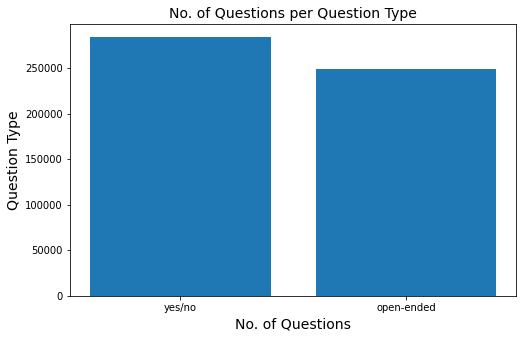

In [13]:
#Featching unique value counts
x = df.questionType.value_counts()

#Plotting No. of questions Vs questionType
plt.figure(figsize=(8,5))
plt.bar(x.index, x.values)
plt.title('No. of Questions per Question Type', fontsize= 14)
plt.xlabel('No. of Questions', fontsize= 14)
plt.ylabel('Question Type', fontsize= 14)
plt.show()

* There are more yes/no type of questions as comapred to open-ended questions.

#### Histogram of Question Word Count

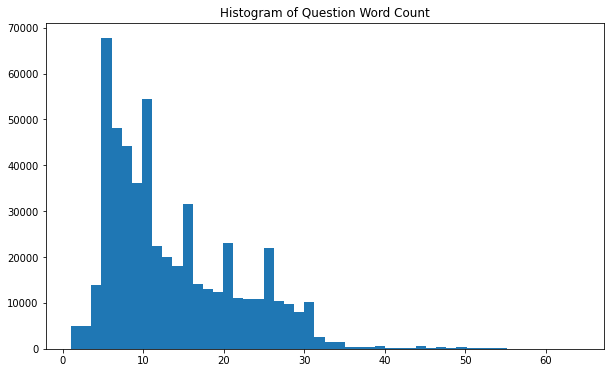

In [14]:
#storing word count of each question
q_len = []
for question in tqdm(df['question']):
    q_len.append(len(question.split()))

#Plotting Histogram
plt.figure(figsize=(10,6))
plt.hist(q_len,50)
plt.title("Histogram of Question Word Count")

plt.show()

* Most questions have length around 5 words.
* No. of short questions are far more than Long questions

#### Box Plot of Question Word Count by Product Category

In [15]:
#Featching unique value counts
values = df.category.value_counts()
#Adding question length as column in dataframe
df['q_length'] = q_len

In [16]:
import plotly.graph_objects as go

#Filtering data for each category
filtered_data=[]
for value in values.index:
    filtered_data.append(df.loc[df['category'] == value]['q_length'])

#Plotting box plot of question word count for every category
data=[]
for y,value in zip(filtered_data,values.index):
    data.append( go.Box( y=y,name = value))

layout = go.Layout(title = "Question length Boxplot of Product Category")
fig = go.Figure(data=data,layout=layout)
fig.show()

* Distribution of each category is almost same.
* Most of the questions in each category have less than 40 word count.

#### Word Cloud for Questions

In [17]:
#Fetching all the words used in questions and converting them to lowercase
words = df['question'].values
allwords = ''
for wordlist in words:
    allwords += wordlist.lower() + ' '


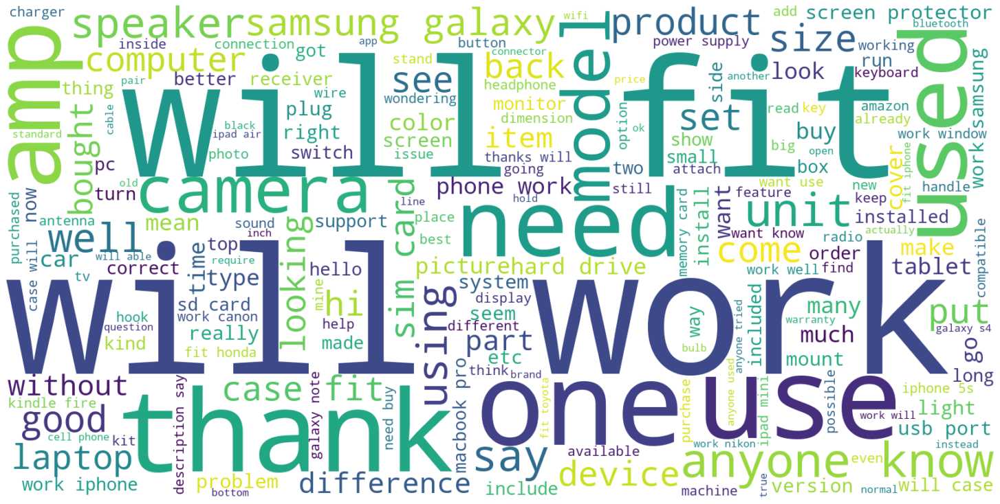

In [18]:
from wordcloud import WordCloud, ImageColorGenerator
from nltk.probability import FreqDist

#Plotting word cloud of question words
wordcloud = WordCloud(width=1600, height=800, background_color='white').generate(allwords)
fig = plt.figure(figsize=(20,18), facecolor='white')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

* The above Wordcloud tells us about the frequency of a particular word in the corpus. Larger the size of the word ,more is its frequency of occurence in the corpus. Words such as : **'will'**, **'work'**, **'fit'**, **'thank'** have higher frequencies.

### Answer Data

#### No. of Answers Vs Answer Type

Text(0, 0.5, 'Answer Type')

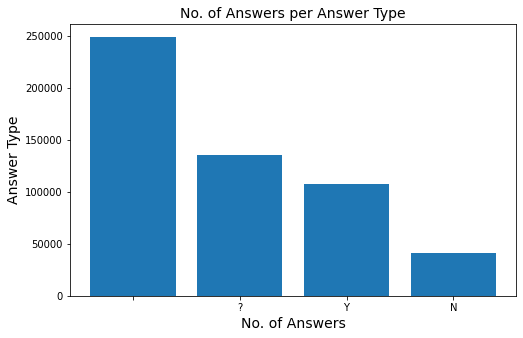

In [19]:
#Featching unique value counts
x = df.answerType.value_counts()

#Plotting No. of questions Vs questionType
plt.figure(figsize=(8,5))
plt.bar(x.index, x.values)
plt.title('No. of Answers per Answer Type', fontsize= 14)
plt.xlabel('No. of Answers', fontsize= 14)
plt.ylabel('Answer Type', fontsize= 14)

* Most of the answers does not have Answer Type.
* Least no. of answers have Answer Type "No".

#### Histogram of Answer Word Count

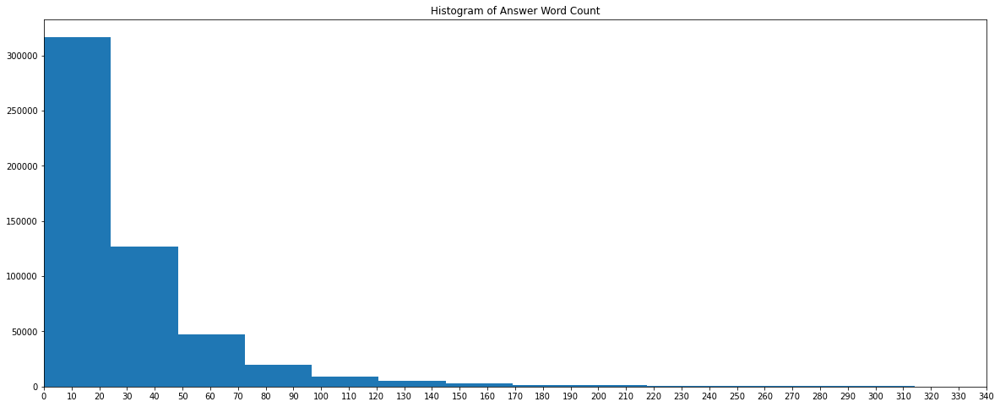

In [20]:
#storing word count of each answer
a_len = []
for answer in tqdm(df['answer']):
    a_len.append(len(answer.split()))

#Plotting Histogram
plt.figure(figsize=(20,8))
plt.xlim(0,300)
plt.hist(a_len,100)
plt.title("Histogram of Answer Word Count")
plt.xticks(range(0,350,10))

plt.show()

* There are high no. of answers that have length below 20 words.
* As the length is increasing the no. of answers are decreasing.
* There are some answers which have exceptionally long length.

#### Box Plot of Answer Word Count by Question Type


In [21]:
#Featching unique value counts
values = df.questionType.value_counts()
#Adding answer word count as column in df
df['a_length']=a_len

In [22]:
import plotly.graph_objects as go

#Filtering data for each questionType
filtered_data=[]
for value in values.index:
    filtered_data.append(df.loc[df['questionType'] == value]['a_length'])

#Plotting box plot of question word count for every questionType
data=[]
for y,value in zip(filtered_data,values.index):
    data.append( go.Box( y=y,name = value))

layout = go.Layout(title = "Answer Word Count Boxplot of Question Types")
fig = go.Figure(data=data,layout=layout)
fig.show()

* Open ended questions have slightly long answers as compared to yes/no questions.

#### Box Plot of Answer Word Count by Product Category

In [23]:
#Featching unique value counts
values = df.category.value_counts()

In [24]:
import plotly.graph_objects as go

#Filtering data for each category
filtered_data=[]
for value in values.index:
    filtered_data.append(df.loc[df['category'] == value]['a_length'])

#Plotting box plot of question word count for every category
data=[]
for y,value in zip(filtered_data,values.index):
    data.append( go.Box( y=y,name = value))
layout = go.Layout(title = "Answer Word Count Boxplot of Product Category")
fig = go.Figure(data=data,layout=layout)
fig.show()

* 75% of questions of all product categories have below/equal to 40 words for answer which means most of the answers are Short to Medium length answers.
* As we can see some categories has some outliers which are extremely long answers.
* Outliers using some threshold on word count of answers should be removed.

#### Word Cloud for Answers

In [25]:
#Fetching all the words used in answers and converting them to lowercase
words = df['answer'].values
allwords = ''
for wordlist in words:
    allwords += wordlist.lower() + ' '


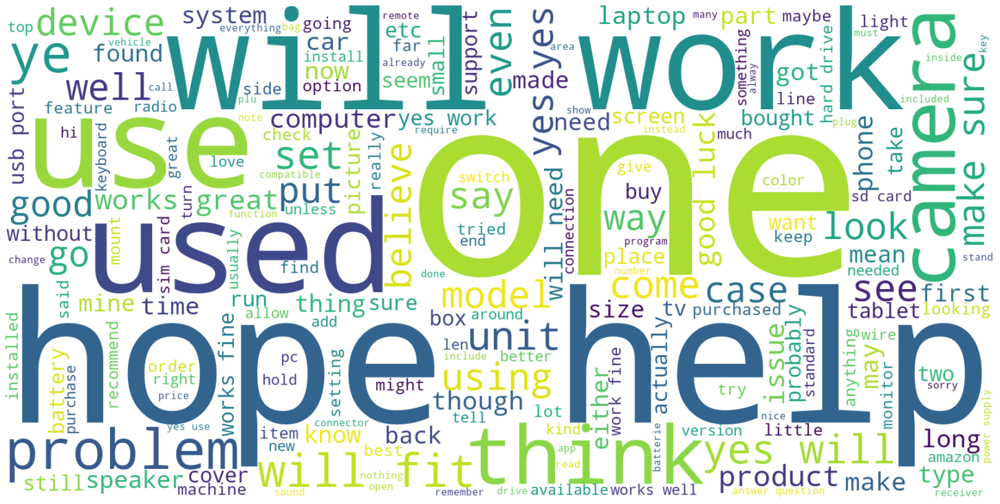

In [26]:
from wordcloud import WordCloud, ImageColorGenerator
from nltk.probability import FreqDist

#Plotting word cloud of question words
wordcloud = WordCloud(width=1600, height=800, background_color='white').generate(allwords)
fig = plt.figure(figsize=(20,18), facecolor='white')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

* The above Wordcloud tells us about the frequency of a particular word in the corpus. Larger the size of the word ,more is its frequency of occurence in the corpus. Words such as : **'one'**, **'hope'**, **'help'** have higher frequencies.

### Meta-Data

#### Box Plot of Title Word Count

In [27]:
#storing word count of each title
title_len = []
for title in tqdm(df['title']):
    title_len.append(len(title.split()))

In [28]:
import plotly.graph_objects as go

#Plotting box plot of title word count.
data = go.Box( y=title_len,name='title')
layout = go.Layout(title = "Boxplot of Title Word Count")
fig = go.Figure(data=data,layout=layout)
fig.show()

* Quartile 1 value is 0 as around 40% of Title data is missing.
* There are some titles with extremely large word counts.





#### Boxplot of Price Word Count


In [29]:
#storing word count of each price
price_len = []
for price in tqdm(df['price']):
    price_len.append(len(price.split()))

In [30]:
import plotly.graph_objects as go

#Plotting box plot of price word count.
data = go.Box( y=price_len,name='price')
layout = go.Layout(title = "Boxplot of Price Word Count")
fig = go.Figure(data=data,layout=layout)
fig.show()

* Median Length is 0 as around 70% of Price data is missing.
* Some of the values for price have 3 words which should be explored further.




In [31]:
df['price_len'] = price_len
df[df['price_len'] > 1].head()

,questionType,asin,question,answerType,answer,category,description,title,brand,price,main_cat,feature,q_length,a_length,price_len
5362,yes/no,B0053F7UIM,Will this work for a Whirpool Model LER7646E,N,"No, wrong part for your dryer. LER7646E models...",Appliances,This is an O.E.M authorized part. Fits various...,Whirlpool 3387747 Element Dryer,,$18.99 - $274.63,Tools & Home Improvement,This is an O.E.M. Authorized part Fits with va...,8,16,3
5363,yes/no,B0053F7UIM,Will this work for Kenmore 110.68722700 ?,?,110 is the source who made it which is whirlpool,Appliances,This is an O.E.M authorized part. Fits various...,Whirlpool 3387747 Element Dryer,,$18.99 - $274.63,Tools & Home Improvement,This is an O.E.M. Authorized part Fits with va...,7,10,3
5364,yes/no,B0053F7UIM,Will this work for Kenmore 110.68722700 ?,?,I used it on model 110.62972101. I don't know ...,Appliances,This is an O.E.M authorized part. Fits various...,Whirlpool 3387747 Element Dryer,,$18.99 - $274.63,Tools & Home Improvement,This is an O.E.M. Authorized part Fits with va...,7,32,3
5365,yes/no,B0053F7UIM,Will this part work on a Whirlpool Duet Mod# G...,?,Go on Whirlpool.com and see if this item will ...,Appliances,This is an O.E.M authorized part. Fits various...,Whirlpool 3387747 Element Dryer,,$18.99 - $274.63,Tools & Home Improvement,This is an O.E.M. Authorized part Fits with va...,11,39,3
5366,yes/no,B0053F7UIM,Does it work for Kenmore 110.86983810 dryer?,?,Not sure. (I'm not a repair technician just a ...,Appliances,This is an O.E.M authorized part. Fits various...,Whirlpool 3387747 Element Dryer,,$18.99 - $274.63,Tools & Home Improvement,This is an O.E.M. Authorized part Fits with va...,7,201,3


* So the "Price" column not only contains the exact price but for some products the range of price is given as seen above. For ex. \$18.99 - \$274.63

#### Box Plot of Description Word Count

In [32]:
#storing word count of each description
description_len = []
for desc in tqdm(df['description']):
    description_len.append(len(desc.split()))

In [33]:
import plotly.graph_objects as go

#Plotting box plot of description word count.
data = go.Box( y=description_len,name='description')
layout = go.Layout(title = "Boxplot of Description Word Count")
fig = go.Figure(data=data,layout=layout)
fig.show()

* Max. Length of Description is 4270
* Quartile 1 value is 0 as almost 45% of Description data is missing

#### Box Pot of Feature Word Count

In [34]:
#storing word count of each feature
feature_len = []
for feature in tqdm(df['feature']):
    feature_len.append(len(feature.split()))

In [35]:
import plotly.graph_objects as go

#Plotting box plot of feature word count.
data = go.Box( y=feature_len,name='feature')
layout = go.Layout(title = "Boxplot of Feature Word Count")
fig = go.Figure(data=data,layout=layout)
fig.show()

* Max. Length of Feature is 647
* Quartile 1 value is 0 as almost 47% of Feature data is missing

#### Box Plot of Brand Word Count 

In [36]:
#storing word count of each brand
brand_len = []
for brand in tqdm(df['brand']):
    brand_len.append(len(brand.split()))

In [37]:
import plotly.graph_objects as go

#Plotting box plot of brand word count.
data = go.Box( y=brand_len,name='brand')
layout = go.Layout(title = "Boxplot of Brand Word Count")
fig = go.Figure(data=data,layout=layout)
fig.show()

* Max. Length of Brand is 17 which is quite high.
* Quartile 1 value is 0 as almost 41% of Brand data is missing

In [38]:
del df['q_length'] ,df['price_len']	,df['asin']

### Summary of EDA

* Around 40% - 50% of product meta-data is missing.
* Price is missing for around 70% of the data
* There are two types of questions:
  * Yes/No Type
  * OpenEnded Type
* Most of the answers are short answers i.e below 20 words.
* Outliers having exceptionaly large no. of words for answers should be removed using some threshold.
* All the columns containing text should be processed such as:
  * Conversion to lower case.
  * Removal of special characters.
  


## Data Pre-Processing

### Removing Datapoints Which Does Not Have All Product Information.


In [39]:
#Replacing empty string with Nan
df = df.replace(to_replace = '', value=np.nan)

#Removing datapoints which does not have any product information.
meta_features = ['brand','title','description','feature','price','main_cat']
df = df.dropna(axis=0, how='any',subset = meta_features )
df


,questionType,question,answerType,answer,category,description,title,brand,price,main_cat,feature,a_length
46,open-ended,filter for vicks3,NaN,Filter for vicks3 is NOT a question. What are ...,Appliances,Keep your air humidifier operating at peak eff...,"Holmes ""C"" Humidifier Filter, HWF65PDQ-U",Holmes,$5.98,Amazon Home,Improves efficiency of the humidifier Extended...,11
47,open-ended,I have not purchased the humidifier that uses ...,NaN,The outer shell will fall apart in about a yea...,Appliances,Keep your air humidifier operating at peak eff...,"Holmes ""C"" Humidifier Filter, HWF65PDQ-U",Holmes,$5.98,Amazon Home,Improves efficiency of the humidifier Extended...,69
48,yes/no,I need to replace a Holmes wick HWF-65T. Does ...,N,The only humidifiers that this will fit are Su...,Appliances,Keep your air humidifier operating at peak eff...,"Holmes ""C"" Humidifier Filter, HWF65PDQ-U",Holmes,$5.98,Amazon Home,Improves efficiency of the humidifier Extended...,34
49,yes/no,will this be replacement for holmes model hm 1...,?,Its generic and does not work in a Holmes humi...,Appliances,Keep your air humidifier operating at peak eff...,"Holmes ""C"" Humidifier Filter, HWF65PDQ-U",Holmes,$5.98,Amazon Home,Improves efficiency of the humidifier Extended...,10
50,yes/no,I would like to buy at least 5 filters. Could ...,?,"Hi: yes, we would bundle all 5 filters and cha...",Appliances,Keep your air humidifier operating at peak eff...,"Holmes ""C"" Humidifier Filter, HWF65PDQ-U",Holmes,$5.98,Amazon Home,Improves efficiency of the humidifier Extended...,13
...,...,...,...,...,...,...,...,...,...,...,...,...
314251,open-ended,how much is the service?,NaN,The activation fee is $44.95 and monthly servi...,Electronics,The SpySpot GL 300MA is a portable GPS Vehicle...,Spy Spot Investigations gl300ma GPS Tracker Po...,SpySpotGPS Tracker,$7.88,GPS & Navigation,Real Time GPS Tracking Tracker Portable GPS Tr...,19
314252,yes/no,"Can I track vehicules in Mexico, in other word...",Y,Yes,Electronics,The SpySpot GL 300MA is a portable GPS Vehicle...,Spy Spot Investigations gl300ma GPS Tracker Po...,SpySpotGPS Tracker,$7.88,GPS & Navigation,Real Time GPS Tracking Tracker Portable GPS Tr...,1
314253,yes/no,Does this device have a way of connecting it t...,?,It's flat on all sides. No loops.,Electronics,The SpySpot GL 300MA is a portable GPS Vehicle...,Spy Spot Investigations gl300ma GPS Tracker Po...,SpySpotGPS Tracker,$7.88,GPS & Navigation,Real Time GPS Tracking Tracker Portable GPS Tr...,7
314254,yes/no,"will this device work in grand canyon, where n...",?,It works on the 2G network. No Cell no workie....,Electronics,The SpySpot GL 300MA is a portable GPS Vehicle...,Spy Spot Investigations gl300ma GPS Tracker Po...,SpySpotGPS Tracker,$7.88,GPS & Navigation,Real Time GPS Tracking Tracker Portable GPS Tr...,17


In [40]:
print("No. of Datapoints --> ",len(df))

No. of Datapoints -->  138790


### Filtering data based on Answer Word Count

In [41]:
df = df.fillna('')

#storing word count of each answer
a_len = []
for answer in tqdm(df['answer']):
    a_len.append(len(answer.split()))

#Adding answer word count as column in df
df['a_length']=a_len

In [42]:
#Percentiles of answwer length
for i in range(10,100,10):
    print("%dth-Percentile --> %d"%(i,np.percentile(df.a_length, i)))

10th-Percentile --> 3
20th-Percentile --> 7
30th-Percentile --> 11
40th-Percentile --> 15
50th-Percentile --> 20
60th-Percentile --> 25
70th-Percentile --> 33
80th-Percentile --> 44
90th-Percentile --> 66


In [43]:
#Using 90th percentile value of answer length as threshold to filter datapoints.
threshold = np.percentile(df.a_length, 90)

#Fetching rows having a_length > threshold.
temp_df = df[df.a_length > threshold]
#Filtering data based on Answer Word Count Using threshold
df = df[df.a_length <= threshold]
print("No.of Removed Rows --> ",len(temp_df))
print("Shape of Dataframe",df.shape)

del df['a_length'],temp_df

No.of Removed Rows -->  13624
Shape of Dataframe (125166, 12)


### Processing Price column

* Price column needs to be processed as it contains range of price(For ex. \$20 - \$30) instead of exact price (For ex. $24) 
*So here we will just use the lower range of price and \$ sign would be removed For ex \$20 - \$30 would be converted to 20.


In [44]:
def process_price(df):
    prices=[]
    for price in df['price']:
        if not type(price)==float:
            if not len(price.split())==1:
                price = price.split('-')[0]
            price = price.replace('$','')
            price = float(price.replace(',',''))
        prices.append(price)
    df['price'] = prices
    return df
    
df = process_price(df)

### Lower Case Conversion

In [45]:
#Defining columns having text data
text_columns = ['question','answer','title','category','description','brand','feature','main_cat']
for column in text_columns:
    #Converting text to lowercase
    df[column] = df[column].str.lower()
df.head()

,questionType,question,answerType,answer,category,description,title,brand,price,main_cat,feature
46,open-ended,filter for vicks3,,filter for vicks3 is not a question. what are ...,appliances,keep your air humidifier operating at peak eff...,"holmes ""c"" humidifier filter, hwf65pdq-u",holmes,5.98,amazon home,improves efficiency of the humidifier extended...
48,yes/no,i need to replace a holmes wick hwf-65t. does ...,N,the only humidifiers that this will fit are su...,appliances,keep your air humidifier operating at peak eff...,"holmes ""c"" humidifier filter, hwf65pdq-u",holmes,5.98,amazon home,improves efficiency of the humidifier extended...
49,yes/no,will this be replacement for holmes model hm 1...,?,its generic and does not work in a holmes humi...,appliances,keep your air humidifier operating at peak eff...,"holmes ""c"" humidifier filter, hwf65pdq-u",holmes,5.98,amazon home,improves efficiency of the humidifier extended...
50,yes/no,i would like to buy at least 5 filters. could ...,?,"hi: yes, we would bundle all 5 filters and cha...",appliances,keep your air humidifier operating at peak eff...,"holmes ""c"" humidifier filter, hwf65pdq-u",holmes,5.98,amazon home,improves efficiency of the humidifier extended...
51,yes/no,is this model for the #1855 holmes humidifier?,?,its for the hwf65. i see other vendors do have...,appliances,keep your air humidifier operating at peak eff...,"holmes ""c"" humidifier filter, hwf65pdq-u",holmes,5.98,amazon home,improves efficiency of the humidifier extended...


### De-Contraction 

In [46]:
def decontraction(text):
    ''' De-contract words in sentences '''
    
    text = re.sub(r"won't", "will not", text)
    text = re.sub(r"can\'t", "can not", text)
    text = re.sub("ain\'t", "are not" , text)
    
    text = re.sub(r"n\'t", " not", text)
    text = re.sub(r"\'re", " are", text)
    text = re.sub(r"\'s", " is", text)
    text = re.sub(r"\'d", " would", text)
    text = re.sub(r"\'ll", " will", text)
    text = re.sub(r"\'t", " not", text)
    text = re.sub(r"\'ve", " have", text)
    text = re.sub(r"\'m", " am", text)
    return text

In [47]:
df = df.fillna('')

text_columns = ['question','answer','title','category','description','brand','feature','main_cat']
for column in tqdm(text_columns):
    #Decontracting words in text.
    df[column]=df[column].apply(lambda x:decontraction(x))

### Adding a space between a word and the punctuation

In [48]:
#Before adding space
df['answer'].iloc[0]

'filter for vicks3 is not a question. what are you asking?'

In [49]:
text_columns = ['question','answer','title','category','description','brand','feature','main_cat']
for column in tqdm(text_columns):
    # creating a space between a word and the punctuation following it
    # eg: "he is a boy." => "he is a boy ."
    # Reference:- https://stackoverflow.com/questions/3645931/python-padding-punctuation-with-white-spaces-keeping-punctuation
    df[column] = df[column].apply(lambda x: re.sub(r"([?.!,¿])", r" \1 ", x))
    df[column] = df[column].apply(lambda x: re.sub(r'[" "]+', " ", x))


In [50]:
#After adding space
df['answer'].iloc[0]

'filter for vicks3 is not a question . what are you asking ? '

### Removing Special Characters

In [51]:
text_columns = ['question','answer','title','category','description','brand','feature','main_cat']
for column in tqdm(text_columns):
    # replacing everything with space except (a-z, A-Z,0-9, ".", "?", "!", ",")
    df[column] = df[column].apply(lambda x: re.sub(r"[^a-zA-Z0-9?.!,¿]+", " ", x))
    

### Removing Extra Spaces

In [52]:
text_columns = ['question','answer','title','category','description','brand','feature','main_cat']
for column in tqdm(text_columns):
    #Removing extra spaces in sentences.
    df[column]=df[column].apply(lambda x: re.sub(' +',' ',x))


### Adding Start and End Tokens

In [53]:
# adding a start and an end token to the sentence
# so that the model know when to start and stop predicting.

def add_tokens(df,columns):
    ''' adds start and end tokens to given columns in given df'''
    for column in tqdm(columns):
        sentences = []
        for sentence in df[column].values:
            sentence = '<start> ' + sentence + ' <end>'
            sentences.append(sentence)
        df[column] = sentences
    return df

#Adding start and end token for questions and answers
df = add_tokens(df,columns=['question','answer'])
df.head()

,questionType,question,answerType,answer,category,description,title,brand,price,main_cat,feature
46,open-ended,<start> filter for vicks3 <end>,,<start> filter for vicks3 is not a question . ...,appliances,keep your air humidifier operating at peak eff...,"holmes c humidifier filter , hwf65pdq u",holmes,5.98,amazon home,improves efficiency of the humidifier extended...
48,yes/no,<start> i need to replace a holmes wick hwf 65...,N,<start> the only humidifiers that this will fi...,appliances,keep your air humidifier operating at peak eff...,"holmes c humidifier filter , hwf65pdq u",holmes,5.98,amazon home,improves efficiency of the humidifier extended...
49,yes/no,<start> will this be replacement for holmes mo...,?,<start> its generic and does not work in a hol...,appliances,keep your air humidifier operating at peak eff...,"holmes c humidifier filter , hwf65pdq u",holmes,5.98,amazon home,improves efficiency of the humidifier extended...
50,yes/no,<start> i would like to buy at least 5 filters...,?,"<start> hi yes , we would bundle all 5 filters...",appliances,keep your air humidifier operating at peak eff...,"holmes c humidifier filter , hwf65pdq u",holmes,5.98,amazon home,improves efficiency of the humidifier extended...
51,yes/no,<start> is this model for the 1855 holmes humi...,?,<start> its for the hwf65 . i see other vendor...,appliances,keep your air humidifier operating at peak eff...,"holmes c humidifier filter , hwf65pdq u",holmes,5.98,amazon home,improves efficiency of the humidifier extended...


## Train-Validation-Test Split

In [54]:
#Using 60,000 datapoints only.
df = df.head(60000)

In [55]:
from sklearn.model_selection import train_test_split

#Fectching only answers
answers = df['answer'].values
del df['answer']

#splitting train and test data with 80:20 ratio.
X_train,X_test,answers_train,answers_test = train_test_split(df ,answers , test_size=0.20)
X_train,X_val,answers_train,answers_val = train_test_split(X_train ,answers_train , test_size=0.20)



print("X_train",len(X_train))
print("answers_train ",len(answers_train))

print("X_val",len(X_val))
print("answers_val ",len(answers_val))


print("\nX_test",len(X_test))
print("answers_test",len(answers_test))

X_train 38400
answers_train  38400
X_val 9600
answers_val  9600

X_test 12000
answers_test 12000


In [56]:
#Saving Data

import pickle
with open('/content/drive/My Drive/X_train.pickle', 'wb') as file:
    pickle.dump(X_train, file)

with open('/content/drive/My Drive/answers_train.pickle', 'wb') as file:
    pickle.dump(answers_train, file)

with open('/content/drive/My Drive/X_val.pickle', 'wb') as file:
    pickle.dump(X_val, file)

with open('/content/drive/My Drive/answers_val.pickle', 'wb') as file:
    pickle.dump(answers_val, file)


with open('/content/drive/My Drive/X_test.pickle', 'wb') as file:
    pickle.dump(X_test, file)

with open('/content/drive/My Drive/answers_test.pickle', 'wb') as file:
    pickle.dump(answers_test, file)